#Colab compatible code


In [1]:
# from google.colab import drive
# drive.mount('/content/gdrive')
# %cd gdrive/MyDrive/DIPLOMATIKH
# !pip install monai

#imports

In [2]:
from utils.dataloader import BreastCancerDataset
from models.simple.Discriminator import Discriminator
from models.simple.Generator import Generator
from models.train import train_GAN
import torch
import torch.nn as nn

In [3]:
EPOCHS  =1
NOISE_SHAPE =(128,4,4,1)
BATCH_SIZE = 2
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
dataset=BreastCancerDataset(dimensions=256,slices=64)
dataloader=  torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
generator  = Generator(NOISE_SHAPE).to(device)
discriminator = Discriminator().to(device)

sliced folder exists
Probelm creating the folder, make sure that the folder does not exits
If it exists, set overwrite to True to overwrite


In [5]:
gen_losses, disc_losses = train_GAN(generator, discriminator, dataloader, NOISE_SHAPE, epochs=EPOCHS, device=device)

In [6]:
torch.save(generator,generator.path)
torch.save(discriminator,discriminator.path)

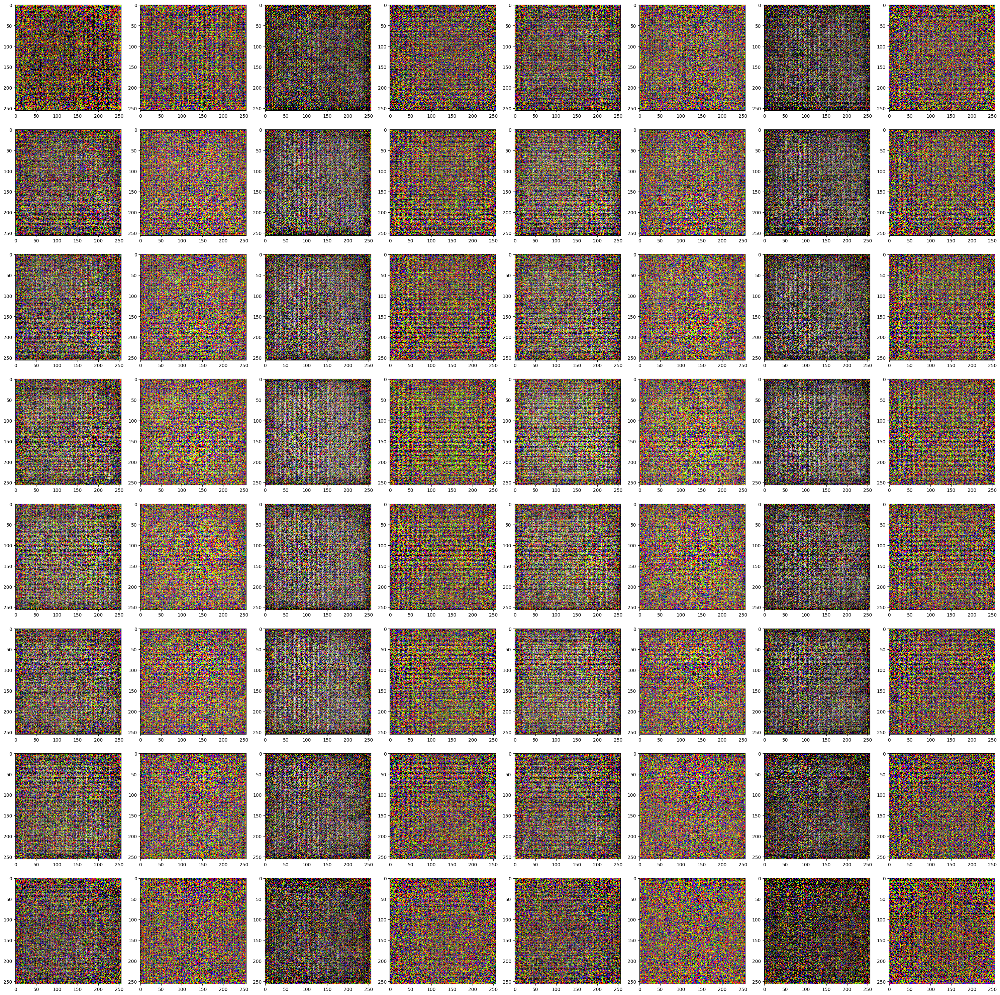

In [7]:
generator.show_generated_image()